# Installing the package

Uncomment this line to download the package. For best results, install PyVaR in a fresh Python environment to avoid conflicts with existing packages.

In [1]:
#pip install git+https://github.com/Alessandro-Dodon/pyvar.git#subdirectory=package


---

## Notebook Overview

This notebook provides a hands-on introduction to our risk management models. For each method, we briefly review the key concepts and formulas, then demonstrate how to apply them using our Python package and sample data. We start with simple, single-asset models in Part I, and move to full portfolio models in Part II, increasing complexity step by step.

Note: For a more comprehensive view of our models consult the report pdf and our extensive modules/ functions documentation.

### Packages

We begin by importing the `pyvar` package along with other necessary libraries for data handling, analysis, and visualization. Ensure all required packages are installed in your environment before proceeding.

In [2]:
import pyvar as pv

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
from itertools import product
import matplotlib.pyplot as plt
import seaborn as sns

---

## Part I: Single-Asset Models

We begin with basic VaR models using a single asset: the Vanguard Total World Stock ETF (VT). This ETF is widely used by both retail and institutional investors as a low-cost, diversified proxy for global equity markets.

While these models are univariate—meaning they analyze one asset at a time—you can apply them to your own portfolio by first computing daily portfolio returns. This is done by summing the monetary positions across assets for each day, then calculating the daily return series.

Note: All our models here use **daily data**.

Feel free to replace the ticker with another asset of interest. Popular choices include:
- S&P 500 Index (`SPY`)
- Apple (`AAPL`)
- Nvidia (`NVDA`)
- Microsoft (`MSFT`)
- Tesla (`TSLA`)

> **Note on Programming Style and Usage Part I:** Most methods use similar inputs such as `returns`, `confidence_level`, and `wealth`, though some may require additional parameters depending on the approach. The main convention is that each VaR function returns a DataFrame, which can be passed to an ES function to compute and append Expected Shortfall. Backtesting, plotting, and forecasting can then be done by calling the corresponding functions. Refer to the function documentation for details.

In [4]:
# Download the VT data from YF
vt_data = yf.download("VT", start="2000-01-01", end="2025-01-01")

# Check for missing values in the entire DataFrame (including the new column)
print(vt_data.isnull().sum())

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed

Price   Ticker
Close   VT        0
High    VT        0
Low     VT        0
Open    VT        0
Volume  VT        0
dtype: int64


In [5]:
# Compute percentage returns and remove the first NaN
vt_data["Percent Returns"] = vt_data["Close"].pct_change()
vt_returns = vt_data["Percent Returns"].dropna()

In [6]:
vt_returns.head()

Date
2008-06-27   -0.001613
2008-06-30    0.000808
2008-07-01   -0.008882
2008-07-02   -0.014664
2008-07-03    0.002687
Name: Percent Returns, dtype: float64

If you want to **download and save the return series as a CSV**, you can do:

```python
vt_returns.to_csv("vt_returns.csv")
```

If you want to **load your own return series from a CSV**, use:

```python
vt_returns = pd.read_csv("your_file.csv", index_col=0, parse_dates=True).squeeze()
```

Make sure:
- The CSV contains one column of daily return values
- The first column becomes the date index
- Dates are properly parsed for the analysis
- Returns are already computed (not prices)

Note: You are responsible for return calculation and data cleaning.  

#### General Setup

We will always use a 99% confidence level, but feel free to experiment with 95% or 97.5%. We will start with investing $100K.

In [7]:
# Set parameters
confidence_level = 0.99 # <----- Can choose 0.95 etc
wealth=100_000 # <----- Wealth invested in our ETF

### Parametric Normal Model

This is one of the simplest models for estimating Value-at-Risk (VaR) and Expected Shortfall (ES). It assumes that returns follow a Normal distribution.

**Value-at-Risk (VaR)** represents the maximum expected loss over a given time horizon at a certain confidence level. Under the Normal distribution, VaR is computed as:

$$
\text{VaR}_\alpha = \sigma \cdot z_\alpha
$$

Where:
- $\sigma$ is the standard deviation of returns  
- $z_\alpha$ is the critical value from the standard Normal distribution (e.g., 2.33 for 99%)  
- $\alpha = 1 - c$ is the probability of a loss exceeding VaR (e.g., 0.01 for 99% confidence level)

VaR (and ES) are usually reported as **positive monetary values**. In our implementation, this is optional — by providing the `wealth` input, the results are automatically scaled to reflect monetary losses. If not provided, the results are expressed in decimals (and can be interpreted as percentages). The markdown formulas below for the univariate models do not explicitly include W (wealth), but it is always used in the calculations.

The **Expected Shortfall (ES)** is also known as Conditional VaR. For a Normal distribution, it has a closed-form expression:

$$
\text{ES}_\alpha = \sigma \cdot \frac{\phi(z_\alpha)}{\alpha}
$$

Where:
- $\phi(z_\alpha)$ is the value of the standard Normal PDF at $z_\alpha$

Generally, VaR and ES are computed with daily data. With parametric models, we make the _very strong_ assumption of **iid** returns. This allows you to scale by $\sqrt{h}$ if you are interested in VaR over a longer horizon. Note however, that all our accessory functions, like plotting, have been tested only with daily data.

Note: While easy to compute, this model often **underestimates tail risk** due to the Normal distribution's thin tails. Financial returns tend to exhibit **fat tails**, so more robust models (like the Student-t) are often preferred. Our parametric function also supports the Student-t distribution if you'd like to account for this.


In [8]:
# Apply Parametric VaR model 
parametric_normal_results = pv.parametric_var(vt_returns, confidence_level, distribution="normal", wealth=wealth) # <----- Can choose t

# Compute ES for the whole period
parametric_normal_results = pv.parametric_es(parametric_normal_results, confidence_level, distribution="normal", wealth=wealth) # <----- Can choose t


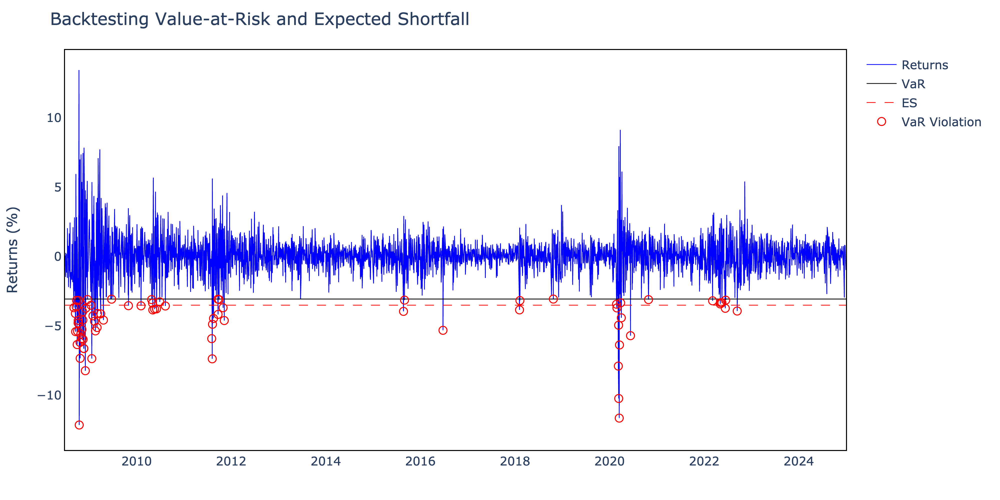

In [9]:
# Plot backtest
pv.plot_backtest(parametric_normal_results, interactive=False) # <----- Can put interactive=True to play with the plot!

In [10]:
parametric_normal_results.head()

,Returns,VaR,VaR Violation,VaR_monetary,ES,ES_monetary
Date,,,,,,
2008-06-27,-0.001613,0.03056,False,3056.034065,0.035012,3501.189801
2008-06-30,0.000808,0.03056,False,3056.034065,0.035012,3501.189801
2008-07-01,-0.008882,0.03056,False,3056.034065,0.035012,3501.189801
2008-07-02,-0.014664,0.03056,False,3056.034065,0.035012,3501.189801
2008-07-03,0.002687,0.03056,False,3056.034065,0.035012,3501.189801


At a 99% confidence level, the daily Value-at-Risk (VaR) of approximately $3,056 means there's only a 1% chance of losing more than this amount in a day. If such a loss occurs, the Expected Shortfall (ES) of about $3,501 represents the average loss on those worst-case days.

#### Backtesting the Parametric Normal Model

The results below confirm the earlier warning about the Normal model underestimating tail risk: we observe **too many violations** for a 99% confidence level.

Also, the independence test fails, showing that violations are **clustered**. This reflects another limitation of the model — it assumes constant volatility over time (i.i.d. returns), which is clearly unrealistic for financial data.

_This highlights the need for models with time-varying volatility._



In [11]:
# Count violations
parametric_normal_violations, parametric_normal_violation_rate = pv.count_violations(parametric_normal_results)

# Kupiec Test (Unconditional Coverage)
parametric_normal_kupiec = pv.kupiec_test(
    total_violations=parametric_normal_violations,
    total_days=len(parametric_normal_results),
    confidence_level=confidence_level
)

# Christoffersen Test (Independence)
parametric_normal_christoffersen = pv.christoffersen_test(parametric_normal_results)

# Joint Test (Conditional Coverage)
parametric_normal_joint = pv.joint_lr_test(
    LR_uc=parametric_normal_kupiec["LR_uc"],
    LR_c=parametric_normal_christoffersen["LR_c"]
)

In [12]:
# Summary output
print(f"\n--- Parametric Normal VaR Backtesting Summary ---")
print(f"Total Violations     : {parametric_normal_violations}")
print(f"Violation Rate       : {parametric_normal_violation_rate * 100:.2f}%\n")

print("Kupiec Test (UC):")
print(f"LR_uc               : {parametric_normal_kupiec['LR_uc']:.4f}")
print(f"p-value             : {parametric_normal_kupiec['p_value']:.4f}")
print(f"Reject Null (5%)    : {parametric_normal_kupiec['reject_null']}")

print("\nChristoffersen Test (Independence):")
print(f"LR_c                : {parametric_normal_christoffersen['LR_c']:.4f}")
print(f"p-value             : {parametric_normal_christoffersen['p_value']:.4f}")
print(f"Reject Null (5%)    : {parametric_normal_christoffersen['reject_null']}")

print("\nJoint Test (Conditional Coverage):")
print(f"LR_total            : {parametric_normal_joint['LR_total']:.4f}")
print(f"p-value             : {parametric_normal_joint['p_value']:.4f}")
print(f"Reject Null (5%)    : {parametric_normal_joint['reject_null']}")


--- Parametric Normal VaR Backtesting Summary ---
Total Violations     : 77
Violation Rate       : 1.85%

Kupiec Test (UC):
LR_uc               : 24.3929
p-value             : 0.0000
Reject Null (5%)    : True

Christoffersen Test (Independence):
LR_c                : 15.6251
p-value             : 0.0001
Reject Null (5%)    : True

Joint Test (Conditional Coverage):
LR_total            : 40.0180
p-value             : 0.0000
Reject Null (5%)    : True


---

### Historical VaR (Non-Parametric)

As an alternative to the Normal model, we show a simple non-parametric approach: Historical VaR. This method uses the empirical distribution of past returns, without making distributional assumptions. It is widely used in practice due to its simplicity and ability to capture fat tails.

We define losses as $ \ell_t = -r_t $. Historical ES (tail mean) is defined as the average of losses that exceed the historical VaR threshold:

$$
\text{ES}_\alpha = \mathbb{E}[\ell_t \mid \ell_t \ge \text{VaR}_\alpha]
$$

If you are interested in VaR or ES over a longer horizon with this model, just use weekly or monthly data.


In [13]:
# Apply Parametric VaR model 
historical_results = pv.historical_var(vt_returns, confidence_level, wealth=wealth) 

# Compute ES for the whole period
historical_results = pv.historical_es(historical_results, wealth=wealth)


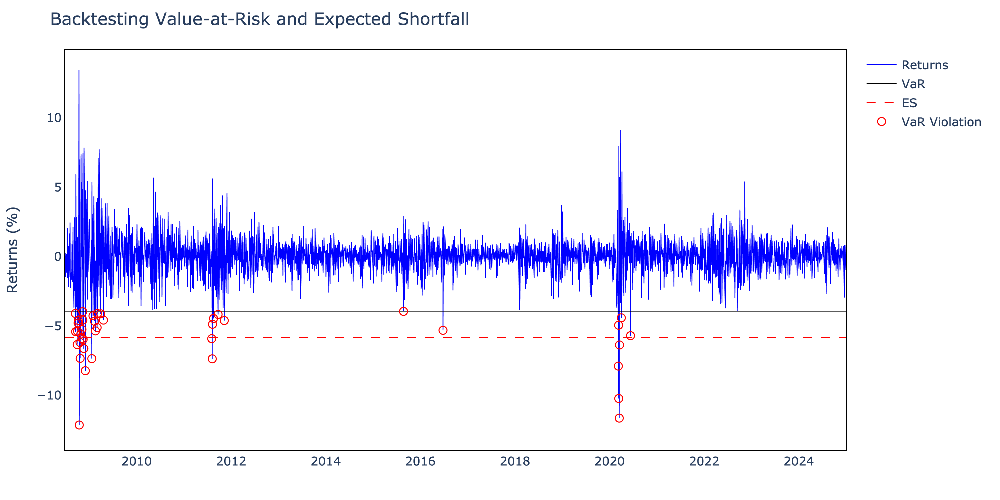

In [14]:
# Plot backtest
pv.plot_backtest(historical_results, interactive=False)

In [15]:
historical_results.head()

,Returns,VaR,VaR Violation,VaR_monetary,ES,ES_monetary
Date,,,,,,
2008-06-27,-0.001613,0.039338,False,3933.752485,0.058366,5836.613813
2008-06-30,0.000808,0.039338,False,3933.752485,0.058366,5836.613813
2008-07-01,-0.008882,0.039338,False,3933.752485,0.058366,5836.613813
2008-07-02,-0.014664,0.039338,False,3933.752485,0.058366,5836.613813
2008-07-03,0.002687,0.039338,False,3933.752485,0.058366,5836.613813


Notice how the VaR and ES increased!

#### Backtesting Historical VaR

The Historical VaR model often shows better performance than the Normal model because it captures fat tails directly from past data. 

Note: Despite being non-parametric, this model is still **not time-varying**. It's possible for it to pass the independence test if the violations are not too clustered by chance, but this is not guaranteed. Indeed, over a longer horizon, clustering tends to happen, and the test is usually failed.

In [16]:
# Count violations
historical_violations, historical_violation_rate = pv.count_violations(historical_results)

# Kupiec Test (Unconditional Coverage)
historical_kupiec = pv.kupiec_test(
    total_violations=historical_violations,
    total_days=len(historical_results),
    confidence_level=confidence_level
)

# Christoffersen Test (Independence)
historical_christoffersen = pv.christoffersen_test(historical_results)

# Joint Test (Conditional Coverage)
historical_joint = pv.joint_lr_test(
    LR_uc=historical_kupiec["LR_uc"],
    LR_c=historical_christoffersen["LR_c"]
)

In [17]:
# Summary output
print(f"\n--- Historical Simulation VaR Backtesting Summary ---")
print(f"Total Violations     : {historical_violations}")
print(f"Violation Rate       : {historical_violation_rate * 100:.2f}%\n")

print("Kupiec Test (UC):")
print(f"LR_uc               : {historical_kupiec['LR_uc']:.4f}")
print(f"p-value             : {historical_kupiec['p_value']:.4f}")
print(f"Reject Null (5%)    : {historical_kupiec['reject_null']}")

print("\nChristoffersen Test (Independence):")
print(f"LR_c                : {historical_christoffersen['LR_c']:.4f}")
print(f"p-value             : {historical_christoffersen['p_value']:.4f}")
print(f"Reject Null (5%)    : {historical_christoffersen['reject_null']}")

print("\nJoint Test (Conditional Coverage):")
print(f"LR_total            : {historical_joint['LR_total']:.4f}")
print(f"p-value             : {historical_joint['p_value']:.4f}")
print(f"Reject Null (5%)    : {historical_joint['reject_null']}")


--- Historical Simulation VaR Backtesting Summary ---
Total Violations     : 42
Violation Rate       : 1.01%

Kupiec Test (UC):
LR_uc               : 0.0047
p-value             : 0.9454
Reject Null (5%)    : False

Christoffersen Test (Independence):
LR_c                : 22.2057
p-value             : 0.0000
Reject Null (5%)    : True

Joint Test (Conditional Coverage):
LR_total            : 22.2104
p-value             : 0.0000
Reject Null (5%)    : True


---


### EVT (Extreme Value Theory)

Extreme Value Theory provides a parametric framework to estimate tail risk by modeling the extreme values beyond a high threshold. It is especially useful when data is scarce or when high-confidence VaRs are needed.

The fitted distribution in the tail is controlled by two parameters:  
- ξ (shape): tail heaviness  
- β (scale): dispersion

EVT VaR (confidence level c) is defined as:

$$
{\text{VaR}_\alpha} = u + \frac{{\beta}}{{\xi}} \left[ \left( \frac{n}{n_u}(1 - c) \right)^{-{\xi}} - 1 \right]
$$

EVT ES is defined as:

$$
{\text{ES}_\alpha} = \frac{{VaR}_\alpha+ {\beta} - {\xi} u}{1 - {\xi}}
$$



This method often improves risk estimates over pure historical simulation by focusing on the distribution's most extreme observations.


In [18]:
# Apply EVT model
evt_results = pv.evt_var(
    returns=vt_returns, 
    confidence_level=confidence_level, 
    threshold_percentile=99, # <----- Can choose 95 etc 
    wealth=wealth
    )

# ES
evt_results = pv.evt_es(
    result_data=evt_results,
    threshold_percentile=99, # <----- Can choose 95 etc
    wealth=wealth
    )


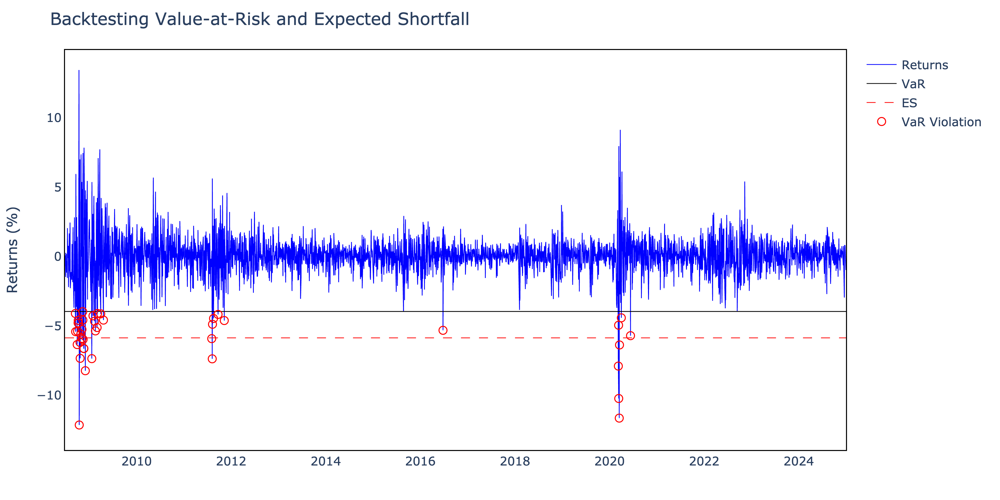

In [19]:
# Plot backtest
pv.plot_backtest(evt_results, interactive=False)

In [20]:
evt_results.head()

,Returns,VaR,VaR Violation,VaR_monetary,ES,ES_monetary
Date,,,,,,
2008-06-27,-0.001613,0.039539,False,3953.948303,0.058566,5856.621023
2008-06-30,0.000808,0.039539,False,3953.948303,0.058566,5856.621023
2008-07-01,-0.008882,0.039539,False,3953.948303,0.058566,5856.621023
2008-07-02,-0.014664,0.039539,False,3953.948303,0.058566,5856.621023
2008-07-03,0.002687,0.039539,False,3953.948303,0.058566,5856.621023


#### Backtesting EVT

In [21]:
# Count violations
evt_violations, evt_violation_rate = pv.count_violations(evt_results)

# Kupiec Test (Unconditional Coverage)
evt_kupiec = pv.kupiec_test(
    total_violations=evt_violations,
    total_days=len(evt_results),
    confidence_level=confidence_level
)

# Christoffersen Test (Independence)
evt_christoffersen = pv.christoffersen_test(evt_results)

# Joint Test (Conditional Coverage)
evt_joint = pv.joint_lr_test(
    LR_uc=evt_kupiec["LR_uc"],
    LR_c=evt_christoffersen["LR_c"]
)

In [22]:
# Summary output
print(f"\n--- EVT VaR Backtesting Summary ---")
print(f"Total Violations     : {evt_violations}")
print(f"Violation Rate       : {evt_violation_rate * 100:.2f}%\n")

print("Kupiec Test (UC):")
print(f"LR_uc               : {evt_kupiec['LR_uc']:.4f}")
print(f"p-value             : {evt_kupiec['p_value']:.4f}")
print(f"Reject Null (5%)    : {evt_kupiec['reject_null']}")

print("\nChristoffersen Test (Independence):")
print(f"LR_c                : {evt_christoffersen['LR_c']:.4f}")
print(f"p-value             : {evt_christoffersen['p_value']:.4f}")
print(f"Reject Null (5%)    : {evt_christoffersen['reject_null']}")

print("\nJoint Test (Conditional Coverage):")
print(f"LR_total            : {evt_joint['LR_total']:.4f}")
print(f"p-value             : {evt_joint['p_value']:.4f}")
print(f"Reject Null (5%)    : {evt_joint['reject_null']}")


--- EVT VaR Backtesting Summary ---
Total Violations     : 41
Violation Rate       : 0.99%

Kupiec Test (UC):
LR_uc               : 0.0077
p-value             : 0.9303
Reject Null (5%)    : False

Christoffersen Test (Independence):
LR_c                : 22.7957
p-value             : 0.0000
Reject Null (5%)    : True

Joint Test (Conditional Coverage):
LR_total            : 22.8034
p-value             : 0.0000
Reject Null (5%)    : True


---


### Volatility Modelling

We now move beyond the constant volatility assumption. All previous models treated volatility as fixed, but financial markets clearly exhibit **time-varying volatility**, especially during periods of stress. This is one reason why simple models often fail the **independence** tests in backtesting.

To better capture real-world dynamics, we adopt **volatility models** such as GARCH-type processes. These models estimate the conditional volatility of returns. While GARCH(1,1) is a common benchmark, here we show a more flexible variant — **GJR-GARCH** — which accounts for the **leverage effect** of negative shocks (volatility tends to rise more after bad news).

The **GJR-GARCH(p, q)** model for conditional variance is:

$$
\sigma_t^2 = \omega + \sum_{i=1}^q a_i r_{t-i}^2 + \sum_{j=1}^p b_j \sigma_{t-j}^2 + \sum_{i=1}^q \gamma_i r_{t-i}^2 \cdot \mathbb{I}_{\{r_{t-i}<0\}}
$$

With the estimated volatility ${\sigma}_t$, we compute the VaR as:

$$
\text{VaR}_t = {\sigma}_t \cdot z_\alpha
$$

To estimate $z_\alpha$, we use a **semi-empirical** approach: we divide the returns by the fitted volatility (to extract standardized innovations $z_t$) and use their empirical quantiles, which better captures asymmetry and fat tails. We also allow for different distributions when estimating GARCH models. In this example, we use the **skewed Student-t distribution**, which is fitted via maximum likelihood and helps account for both asymmetry and heavy tails — properties often observed in financial return series.

This approach — GARCH models combined with flexible distributions — is one of the most widely used by risk managers in practice. Feel free to experiment with our other volatility models, like APARCH, EGARCH, EWMA etc.

Note: Our volatility models always give a dataframe output of results and the next day VaR estimate. As here _we don't assume_ iid returns, scaling by $\sqrt{h}$ is not possible. Using weekly or monthly data for volatility models is not recommended. For a longer horizon estimate, we will show our forecasting functions next.

In [23]:
# Apply GARCH volatility model
garch_results, next_day_var = pv.garch_var(vt_returns, confidence_level, model="GJR", distribution="skewt", wealth=wealth) # <----- Can choose "APARCH" etc

print(f"Next-day GARCH VaR estimate: ${next_day_var:.2f}")

# Compute ES for the whole period
garch_results = pv.volatility_es(garch_results, confidence_level, wealth=wealth)

Next-day GARCH VaR estimate: $3072.23


Results are shown for a subset of high volatility.


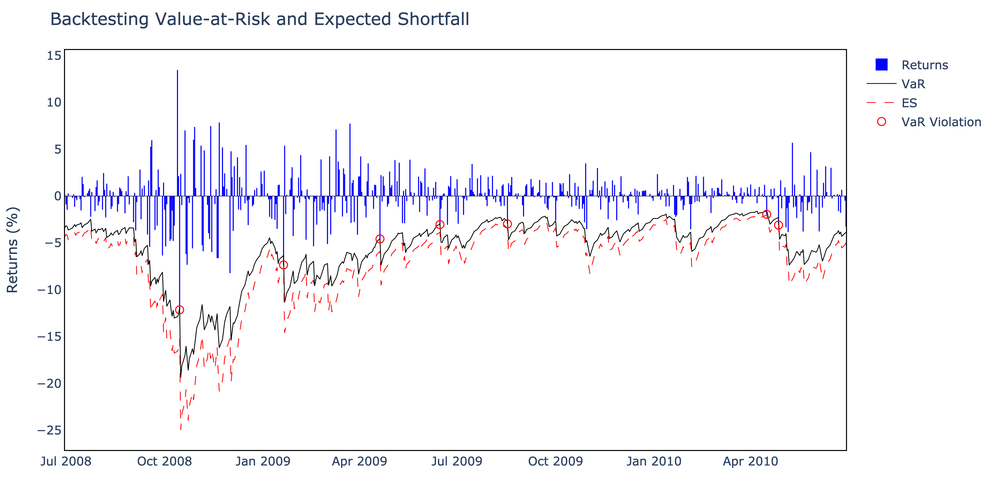

In [24]:
# Plot backtest 
pv.plot_backtest(garch_results, subset=("2008-06-29","2010-06-29"), interactive=False) # <----- Can select another subset or the full period!


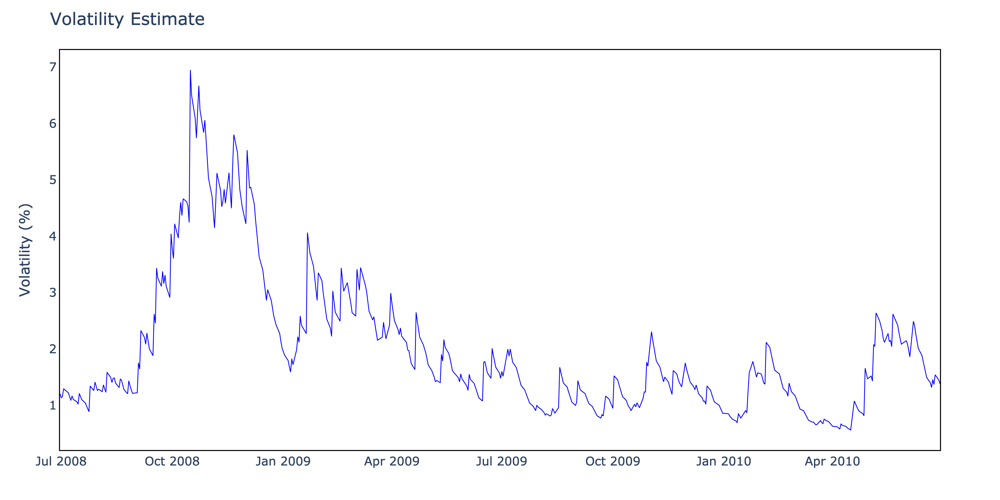

In [25]:
# Plot volatility 
pv.plot_volatility(garch_results["Volatility"], subset=("2008-06-29","2010-06-29"), interactive=False)

#### Forecasting 

Once we fit a GARCH(1,1) model, we can use it to forecast future volatility and compute forward-looking VaR. These forecasts can be for a specific day ahead ($\tau$-step forecast) or cumulative over a given horizon ($T$-day total).

The GARCH(1,1) Variance Forecast (analytical) is computed as follows.

**Forecast for single-step variance $\tau$ steps ahead:**

$$
\mathbb{E}[\sigma_{t+\tau}^2] = \text{VL} + (a + b)^\tau \cdot (\sigma_t^2 - \text{VL})
$$

**Forecast for cumulative variance over $T$ days:**

$$
\mathbb{E}[\sigma_{t,T}^2] =
\text{VL} \cdot \left( T - 1 - \frac{(a + b)(1 - (a + b)^{T - 1})}{1 - (a + b)} \right)
+ \sigma_t^2 \cdot \frac{1 - (a + b)^T}{1 - (a + b)}
$$

Where:
- $\text{VL} = \dfrac{\omega}{1 - a - b}$ is the long-run variance  
- $\sigma_t^2$ is the last fitted conditional variance

Once variance is forecasted, the VaR over the chosen horizon is easily obtained using $z_\alpha$ as the quantile of the standardized innovations distribution.

In [26]:
# Define a setup
steps_list = [3, 10, 20] # <----- Can choose other values!
cumulative_list = [False, True]

print("\n--- GARCH(1,1) VaR Forecasts (99% Confidence) ---")
for steps, is_cumulative in product(steps_list, cumulative_list):
    try:
        var_estimate = pv.forecast_garch_var( 
            returns=vt_returns,
            steps_ahead=steps,
            cumulative=is_cumulative,
            confidence_level=0.99,
            wealth=wealth
        )
        tag = "CUM" if is_cumulative else "Single"
        print(f"VaR | {steps}-day | {tag:<6}: ${var_estimate:.2f}")
    except Exception as e:
        print(f"VaR | {steps}-day | {tag:<6}: ERROR → {e}")

print("\n--- GARCH(1,1) Volatility Forecasts ---")
for steps, is_cumulative in product(steps_list, cumulative_list):
    try:
        variance = pv.forecast_garch_variance(
            returns=vt_returns,
            steps_ahead=steps,
            cumulative=is_cumulative
        )
        vol_pct = np.sqrt(variance) * 100
        tag = "CUM" if is_cumulative else "Single"
        print(f"Volatility | {steps}-day | {tag:<6}: {vol_pct:.4f}%")
    except Exception as e:
        print(f"Volatility | {steps}-day | {tag:<6}: ERROR → {e}")


--- GARCH(1,1) VaR Forecasts (99% Confidence) ---
VaR | 3-day | Single: $2647.73
VaR | 3-day | CUM   : $4530.81
VaR | 10-day | Single: $2750.30
VaR | 10-day | CUM   : $8443.36
VaR | 20-day | Single: $2876.71
VaR | 20-day | CUM   : $12255.87

--- GARCH(1,1) Volatility Forecasts ---
Volatility | 3-day | Single: 0.9863%
Volatility | 3-day | CUM   : 1.6877%
Volatility | 10-day | Single: 1.0245%
Volatility | 10-day | CUM   : 3.1451%
Volatility | 20-day | Single: 1.0716%
Volatility | 20-day | CUM   : 4.5653%


#### Backtesting

Notice how each test is succesfully passed! This refers to the full period, not just the subset shown above.

In [27]:
# Count violations
garch_violations, garch_violation_rate = pv.count_violations(garch_results)

# Kupiec Test (Unconditional Coverage)
garch_kupiec = pv.kupiec_test(
    total_violations=garch_violations,
    total_days=len(garch_results),
    confidence_level=confidence_level
)

# Christoffersen Test (Independence)
garch_christoffersen = pv.christoffersen_test(garch_results)

# Joint Test (Conditional Coverage)
garch_joint = pv.joint_lr_test(
    LR_uc=garch_kupiec["LR_uc"],
    LR_c=garch_christoffersen["LR_c"]
)

In [28]:
# Summary output
print(f"\n--- GARCH VaR Backtesting Summary (GJR, skewed-t) ---")
print(f"Total Violations     : {garch_violations}")
print(f"Violation Rate       : {garch_violation_rate * 100:.2f}%\n")

print("Kupiec Test (UC):")
print(f"LR_uc               : {garch_kupiec['LR_uc']:.4f}")
print(f"p-value             : {garch_kupiec['p_value']:.4f}")
print(f"Reject Null (5%)    : {garch_kupiec['reject_null']}")

print("\nChristoffersen Test (Independence):")
print(f"LR_c                : {garch_christoffersen['LR_c']:.4f}")
print(f"p-value             : {garch_christoffersen['p_value']:.4f}")
print(f"Reject Null (5%)    : {garch_christoffersen['reject_null']}")

print("\nJoint Test (Conditional Coverage):")
print(f"LR_total            : {garch_joint['LR_total']:.4f}")
print(f"p-value             : {garch_joint['p_value']:.4f}")
print(f"Reject Null (5%)    : {garch_joint['reject_null']}")


--- GARCH VaR Backtesting Summary (GJR, skewed-t) ---
Total Violations     : 42
Violation Rate       : 1.01%

Kupiec Test (UC):
LR_uc               : 0.0047
p-value             : 0.9454
Reject Null (5%)    : False

Christoffersen Test (Independence):
LR_c                : 0.5786
p-value             : 0.4468
Reject Null (5%)    : False

Joint Test (Conditional Coverage):
LR_total            : 0.5833
p-value             : 0.7470
Reject Null (5%)    : False


---

## Part II: Portfolio Models

We now move to portfolio-level risk models. Our package provides simple functions to automatically build your portfolio: prices are downloaded from Yahoo Finance, you specify the number of shares, and optionally convert everything to your base currency (CHF in our case). Those are particularly useful to check common problems like missing values, stability of the VCV etc.

Our example portfolio follows a stylized global equity strategy:  
- Long positions in broad market, regional, and sector ETFs (VT, SPY, VGK, EWJ, VWO)  
- Exposure to leading firms in tech, healthcare, and consumer sectors (AAPL, JNJ, PG, UNH, NVS)  
- A small short position in industrials (XLI) to hedge against cyclical downturns

We assume a **buy-and-hold** or "lazy portfolio" strategy. No active trading or rebalancing is considered. If the portfolio composition changes, all subsequent VaR and ES metrics must be recomputed from that point onward.

> **Note on Programming Style and Usage PT II:** The underlying models for portfolio VaR/ES can differ substantially. Consequently, some functions expect an matrix of monetary positions, while others take a vector of returns or a matrix of prices as their primary input. If you are unsure which format a particular function requires, always consult its documentation first. Refer to the individual function documentation for full argument lists and usage examples.

In [29]:
# Define shares — globally diversified portfolio
shares = pd.Series({
    "VT": 120,     # Global equity ETF
    "SPY": 80,     # US large-cap ETF
    "VGK": 60,     # Europe ETF
    "EWJ": 40,     # Japan ETF
    "VWO": 60,     # Emerging Markets ETF
    "AAPL": 50,    # Apple — tech
    "JNJ": 50,     # Johnson & Johnson — healthcare
    "PG": 40,      # Procter & Gamble — consumer staples
    "UNH": 40,     # UnitedHealth — healthcare
    "NVS": 30,     # Novartis — Swiss healthcare
    "XLI": -30     # US industrials sector ETF — short hedge
})

# Download prices and convert to base currency
tickers = shares.index.tolist()
raw_prices = pv.get_raw_prices(tickers, start="2023-01-01", end="2025-01-01")
prices_chf = pv.convert_to_base_currency(raw_prices, base_currency="CHF")

# Compute monetary position values over time
portfolio_matrix = pv.create_portfolio(prices_chf, shares)

# Compute portfolio returns and statistics
portfolio_returns = pv.compute_returns(portfolio_matrix)

[currency detection] AAPL: USD
[currency detection] EWJ: USD
[currency detection] JNJ: USD
[currency detection] NVS: USD
[currency detection] PG: USD
[currency detection] SPY: USD
[currency detection] UNH: USD
[currency detection] VGK: USD
[currency detection] VT: USD
[currency detection] VWO: USD
[currency detection] XLI: USD
[fx download] Downloading FX pairs: CHFUSD=X
[conversion] AAPL: USD → CHF via CHFUSD=X
[conversion] EWJ: USD → CHF via CHFUSD=X
[conversion] JNJ: USD → CHF via CHFUSD=X
[conversion] NVS: USD → CHF via CHFUSD=X
[conversion] PG: USD → CHF via CHFUSD=X
[conversion] SPY: USD → CHF via CHFUSD=X
[conversion] UNH: USD → CHF via CHFUSD=X
[conversion] VGK: USD → CHF via CHFUSD=X
[conversion] VT: USD → CHF via CHFUSD=X
[conversion] VWO: USD → CHF via CHFUSD=X
[conversion] XLI: USD → CHF via CHFUSD=X


In [30]:
prices_chf.tail()

,AAPL,EWJ,JNJ,NVS,PG,SPY,UNH,VGK,VT,VWO,XLI
Date,,,,,,,,,,,
2024-12-24,231.426704,59.703327,128.896222,85.194986,149.932985,538.629676,452.780635,57.197983,107.196704,40.183616,120.169604
2024-12-26,232.407133,60.459014,128.793635,85.328432,151.175422,539.235123,457.782140,57.410746,107.435559,40.127268,120.386331
2024-12-27,229.196950,60.882496,128.250566,85.270424,150.528611,533.250337,456.479130,57.189546,106.531227,39.960390,119.420564
2024-12-30,226.896698,60.567577,127.153121,84.627656,148.847343,528.889299,456.005529,56.999353,105.845920,39.739729,118.606393
2024-12-31,225.645051,60.607406,128.487744,84.741616,149.578060,527.783271,454.968611,57.096842,105.767162,39.738259,118.646443


In [31]:
# Compute latest portfolio value and weights
latest_prices = prices_chf.iloc[-1]
portfolio_value_chf = (shares * latest_prices).sum()
weights = (shares * latest_prices) / portfolio_value_chf

# Print final portfolio value and weights
print(f"\nFinal portfolio value in CHF: {portfolio_value_chf:,.2f}\n")
print("Portfolio weights (based on latest prices):")
print(weights.round(4).sort_values(ascending=False))


Final portfolio value in CHF: 104,020.49

Portfolio weights (based on latest prices):
SPY     0.4059
UNH     0.1750
VT      0.1220
AAPL    0.1085
JNJ     0.0618
PG      0.0575
VGK     0.0329
NVS     0.0244
EWJ     0.0233
VWO     0.0229
XLI    -0.0342
dtype: float64


A quick way to observe the correlations of our portfolio!


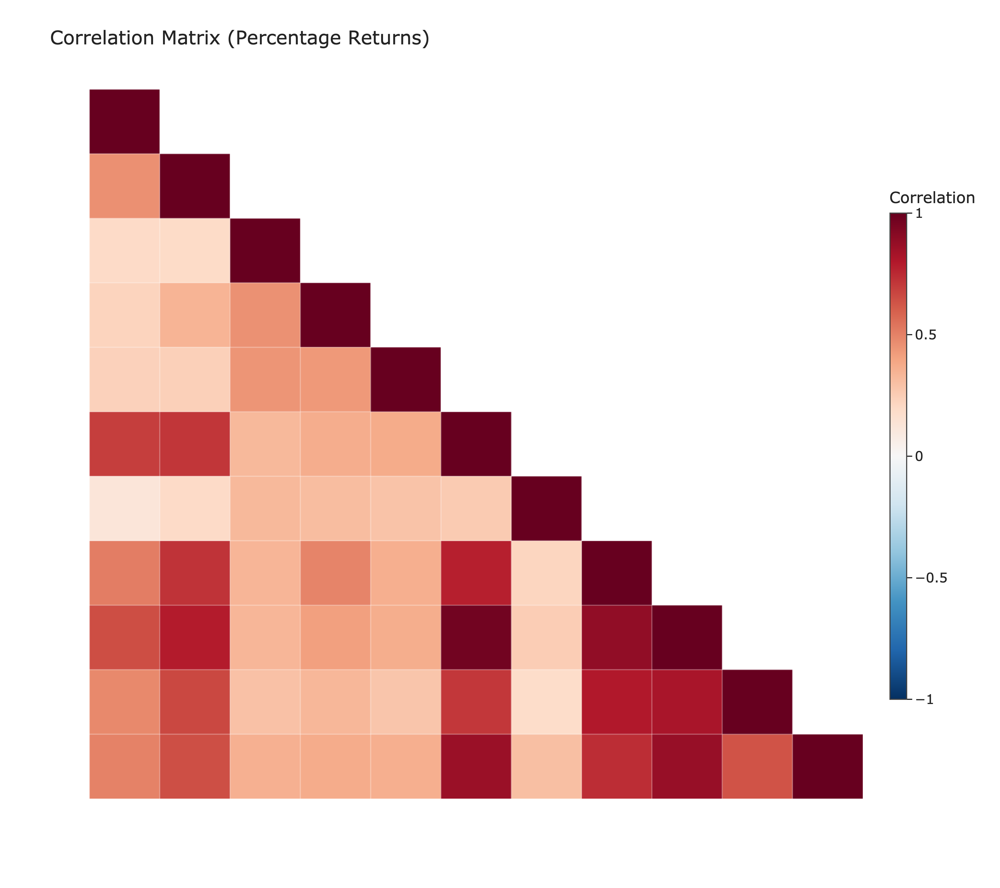

In [32]:
pv.plot_correlation_matrix(portfolio_matrix, interactive=False)

In [33]:
portfolio_matrix.tail()

,AAPL,EWJ,JNJ,NVS,PG,SPY,UNH,VGK,VT,VWO,XLI
Date,,,,,,,,,,,
2024-12-24,11571.335187,2388.133070,6444.811080,2555.849567,5997.319403,43090.374078,18111.225382,3431.878969,12863.604424,2411.016937,-3605.088133
2024-12-26,11620.356641,2418.360562,6439.681748,2559.852947,6047.016898,43138.809837,18311.285582,3444.644754,12892.267131,2407.636101,-3611.589917
2024-12-27,11459.847524,2435.299853,6412.528308,2558.112730,6021.144452,42660.026965,18259.165198,3431.372780,12783.747215,2397.623373,-3582.616921
2024-12-30,11344.834895,2422.703064,6357.656070,2538.829686,5953.893739,42311.143885,18240.221173,3419.961175,12701.510421,2384.383741,-3558.191794
2024-12-31,11282.252544,2424.296232,6424.387178,2542.248472,5983.122385,42222.661667,18198.744432,3425.810494,12692.059396,2384.295513,-3559.393297


In [34]:
portfolio_returns.tail()

,AAPL,EWJ,JNJ,NVS,PG,SPY,UNH,VGK,VT,VWO,XLI
Date,,,,,,,,,,,
2024-12-24,0.017617,0.005464,0.010086,0.005047,0.011036,0.017251,0.005592,0.011608,0.014032,0.010130,0.013929
2024-12-26,0.004236,0.012657,-0.000796,0.001566,0.008287,0.001124,0.011046,0.003720,0.002228,-0.001402,0.001804
2024-12-27,-0.013813,0.007004,-0.004217,-0.000680,-0.004279,-0.011099,-0.002846,-0.003853,-0.008417,-0.004159,-0.008022
2024-12-30,-0.010036,-0.005173,-0.008557,-0.007538,-0.011169,-0.008178,-0.001038,-0.003326,-0.006433,-0.005522,-0.006818
2024-12-31,-0.005516,0.000658,0.010496,0.001347,0.004909,-0.002091,-0.002274,0.001710,-0.000744,-0.000037,0.000338


If you want to **save the DataFrame shown above**, use:

```python
portfolio_returns.to_csv("portfolio_returns.csv")
```

If you want to **import your own CSV**, make sure the first column contains dates and use:

```python
df = pd.read_csv("your_file.csv", index_col=0, parse_dates=True)
```

This ensures:
- The first column becomes the date index
- Dates are properly parsed for the analysis

Note: You are responsible for data cleaning and pre-processing when using your own files. Our data-download functions will print warnings if there are issues, but they do not perform automatic cleaning.

---

### Analytic VaR 

We now cover several models for in-depth portfolio risk analysis. We begin with two standard portfolio-level VaR measures:

- **Asset-Normal VaR (AN VaR)**  
  $$
  \text{VaR}_t = z_\alpha \cdot \sqrt{x_t^\top \Sigma x_t} \cdot \sqrt{h}
  $$

- **Undiversified VaR (UVaR)**  
  $$
  \text{UVaR}_t = z_\alpha \cdot \sum_{i=1}^N \sigma_i x_{i,t} \cdot \sqrt{h}
  $$

Here, $x_t$ are the monetary positions, $\Sigma$ is the covariance matrix of returns, $z_\alpha$ is the critical value from the standard Normal distribution and $h$ is the horizon in days.

We compute these metrics over time and visualize the results to assess diversification and portfolio risk dynamics.


In [35]:
# Compute and display the AN VaR   
asset_normal_results = pv.asset_normal_var(position_data=portfolio_matrix,
                                 confidence_level=confidence_level)


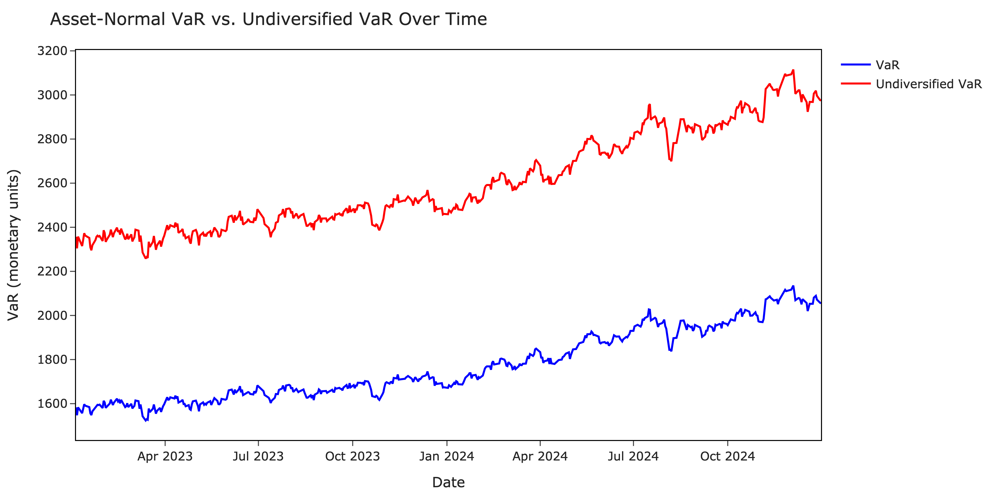

In [36]:
pv.plot_var_vs_uvar(asset_normal_results, interactive=False)

In [37]:
asset_normal_results.head()

,Diversified_VaR,Undiversified_VaR,Diversification_Benefit
Date,,,
2023-01-04,1582.940231,2356.956956,774.016724
2023-01-05,1547.469135,2304.300034,756.830900
2023-01-06,1583.197145,2357.521520,774.324375
2023-01-09,1565.093031,2328.162564,763.069533
2023-01-10,1556.767130,2314.873508,758.106378


We now proceed with **Component VaR**, which breaks down the total portfolio VaR into the contribution of each asset.

To compute it, we first need the **Marginal VaR**, defined as:

$$
\Delta \text{VaR}_{i,t} = \text{VaR}_t \cdot \frac{(\Sigma x_t)_i}{x_t^\top \Sigma x_t}
$$

Then, **Component VaR** is given by:

$$
\text{CVaR}_{i,t} = x_{i,t} \cdot \Delta \text{VaR}_{i,t}
$$

These metrics help understand **how much risk each position contributes** to the total portfolio risk. Component VaR is widely used for portfolio optimization and monitoring concentration risk.

Note: Each of those in-depth portfolio metrics can be called independently. You don't need to first calculate the marginal VaR to compute the component VaR, the functions will call the each other automatically.

In [38]:
# Compute and display Component VaR (styled table)
component_df = pv.component_var(
    position_data=portfolio_matrix,
    confidence_level=confidence_level
)


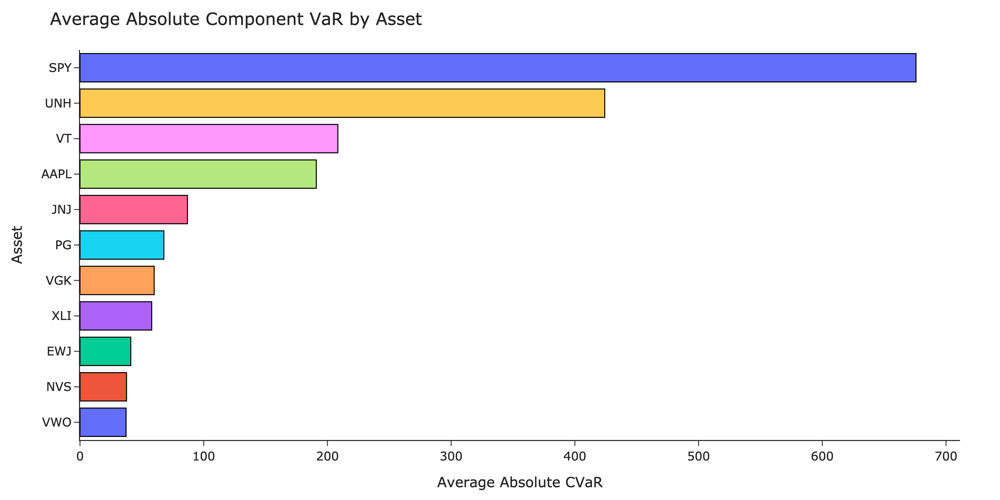

In [39]:
pv.plot_component_var_bar(component_df, interactive=False)


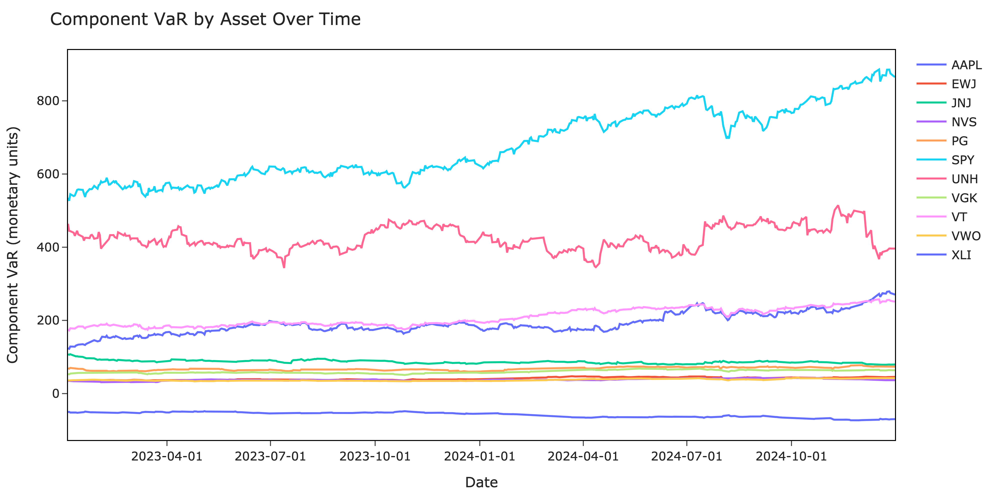

In [40]:
pv.plot_component_var_lines(component_df, interactive=False)

In [41]:
component_df.head()

,AAPL,EWJ,JNJ,NVS,PG,SPY,UNH,VGK,VT,VWO,XLI
Date,,,,,,,,,,,
2023-01-04,124.086245,34.570524,107.537688,34.923464,69.335571,534.984322,463.998745,53.385681,175.063501,35.734835,-50.680343
2023-01-05,122.403911,33.975245,106.148402,34.324974,68.083651,526.873333,444.730583,52.710819,172.620318,35.508886,-49.910988
2023-01-06,128.602905,35.204989,107.472495,35.104940,70.194786,544.797333,443.913580,54.686143,178.480703,36.504306,-51.765035
2023-01-09,128.096546,34.989851,103.142992,33.788968,68.472498,539.777917,439.623317,54.536925,177.352893,36.381735,-51.070610
2023-01-10,128.225942,34.763848,102.114201,33.750141,67.939701,541.383211,431.042734,54.569984,177.598201,36.491743,-51.112576


We conclude the in-depth portfolio analytics with:

- **Incremental VaR**  
  $$
  \text{IVaR}_t = \Delta \text{VaR}_t^\top \cdot a
  $$

This measures the change in total portfolio VaR resulting from adding or removing a position vector $a$. It's useful for **what-if analysis** — understanding the impact of a new investment or a reallocation on overall risk before making the change.

In this specific module, there are also the respective ES measures, feel free to experiment with them!

In [42]:
# Define change in position
change_vector = [0,10_000,0,0,0,0,0,0,0,0,0] # 10K CHF in SPY

# Compute and display Incremental VaR
ivar_series = pv.incremental_var(
    position_data=portfolio_matrix,
    change_vector=change_vector,
    confidence_level=confidence_level
)

In [43]:
ivar_series

Date
2023-01-04    178.133595
2023-01-05    178.643646
2023-01-06    179.376715
2023-01-09    179.610457
2023-01-10    180.027703
                 ...    
2024-12-24    188.778943
2024-12-26    188.650152
2024-12-27    188.591639
2024-12-30    188.508231
2024-12-31    188.493449
Length: 501, dtype: float64

---

### Time Varying Correlation Models

These models are the multivariate extension of volatility models. Instead of assuming constant correlations, we estimate a **time-varying covariance matrix** at each step.

We support two models:
- **Moving Average (MA)** 
- **Exponentially Weighted Moving Average (EWMA)** 

Here we use the EWMA version. At each time $t$, the covariance matrix is updated as:

$$
\Sigma_t = \lambda \Sigma_{t-1} + (1 - \lambda) r_{t-1} r_{t-1}^\top
$$

The portfolio volatility is:

$$
\sigma_{p,t} = \sqrt{w_t^\top \Sigma_t w_t}
$$

Then, VaR is:

$$
\text{VaR}_t = z_\alpha \cdot \sigma_{p,t} \cdot \text{PortfolioValue}_t
$$

We offer both:
- **Parametric version**: uses Normal quantile $z_\alpha$
- **Semi-empirical version**: estimates $z_\alpha$ from standardized innovations

This is one of the most commonly used portfolio VaR models in practice.



In [44]:
# Run RiskMetrics Correlation VaR
result_ewma_correlation = pv.ewma_correlation_var(portfolio_matrix, distribution="empirical") # <----- Can choose normal here!

# ES RiskMetrics
result_ewma_correlation = pv.correlation_es(result_ewma_correlation)


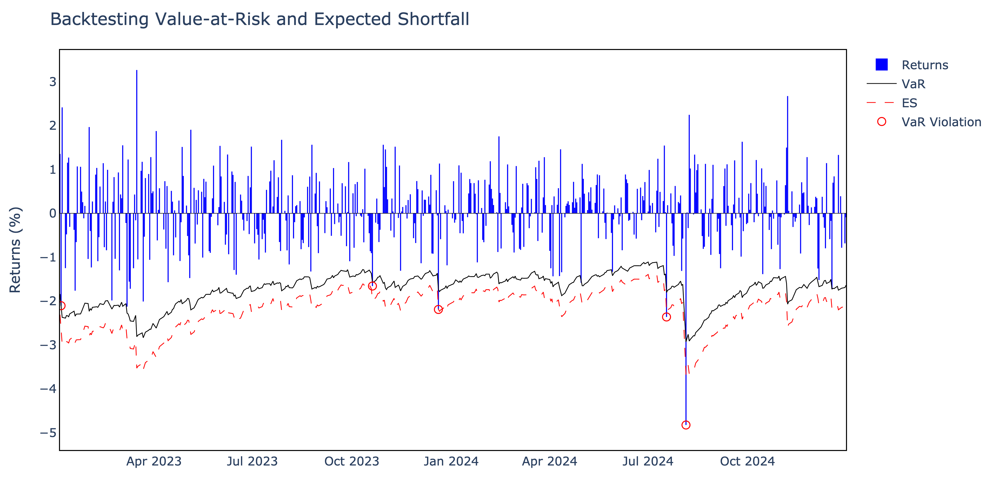

In [45]:
# Plot RiskMetrics model results
pv.plot_backtest(result_ewma_correlation, interactive=False)


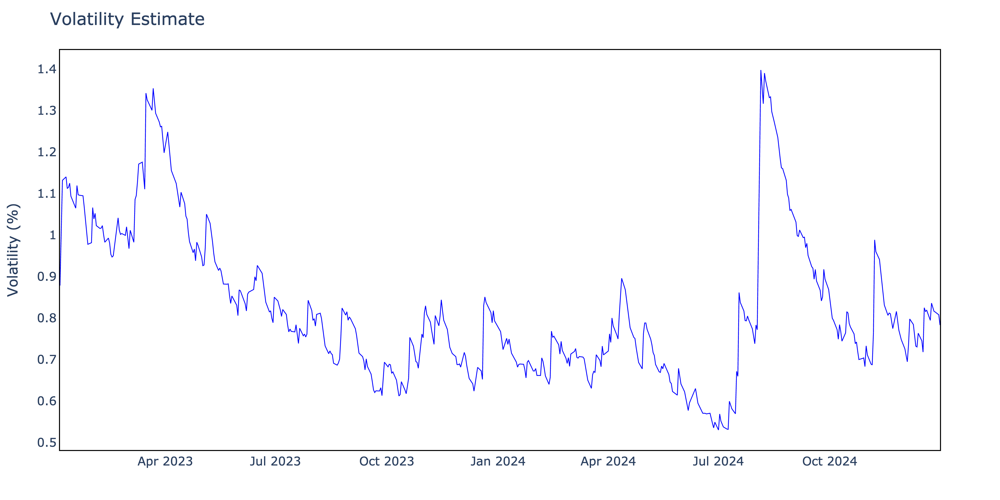

In [46]:
# Plot interactive volatility for a subset
pv.plot_volatility(result_ewma_correlation["Volatility"], interactive=False)

In [47]:
result_ewma_correlation.head()

,Returns,Volatility,Innovations,VaR,VaR Monetary,VaR Violation,ES,ES Monetary
2023-01-04,0.013534,0.008783,1.540969,0.018399,1492.436425,False,0.023100,1873.740027
2023-01-05,-0.021059,0.009957,-2.114927,0.020860,1656.284445,True,0.026189,2079.449690
2023-01-06,0.024139,0.011318,2.132769,0.023711,1927.887482,False,0.029768,2420.444771
2023-01-09,-0.012487,0.011402,-1.095208,0.023885,1917.671419,False,0.029988,2407.618600
2023-01-10,-0.004802,0.011121,-0.431796,0.023298,1861.490115,False,0.029251,2337.083496


Near perfect results!

In [48]:
# Count violations
ewma_corr_violations, ewma_corr_violation_rate = pv.count_violations(result_ewma_correlation)

# Kupiec Test (Unconditional Coverage)
ewma_corr_kupiec = pv.kupiec_test(
    total_violations=ewma_corr_violations,
    total_days=len(result_ewma_correlation),
    confidence_level=confidence_level
)

# Christoffersen Test (Independence)
ewma_corr_christoffersen = pv.christoffersen_test(result_ewma_correlation)

# Joint Test (Conditional Coverage)
ewma_corr_joint = pv.joint_lr_test(
    LR_uc=ewma_corr_kupiec["LR_uc"],
    LR_c=ewma_corr_christoffersen["LR_c"]
)

In [49]:
# Summary output
print(f"\n--- RiskMetrics Correlation VaR Backtesting Summary ---")
print(f"Total Violations     : {ewma_corr_violations}")
print(f"Violation Rate       : {ewma_corr_violation_rate * 100:.2f}%\n")

print("Kupiec Test (UC):")
print(f"LR_uc               : {ewma_corr_kupiec['LR_uc']:.4f}")
print(f"p-value             : {ewma_corr_kupiec['p_value']:.4f}")
print(f"Reject Null (5%)    : {ewma_corr_kupiec['reject_null']}")

print("\nChristoffersen Test (Independence):")
print(f"LR_c                : {ewma_corr_christoffersen['LR_c']:.4f}")
print(f"p-value             : {ewma_corr_christoffersen['p_value']:.4f}")
print(f"Reject Null (5%)    : {ewma_corr_christoffersen['reject_null']}")

print("\nJoint Test (Conditional Coverage):")
print(f"LR_total            : {ewma_corr_joint['LR_total']:.4f}")
print(f"p-value             : {ewma_corr_joint['p_value']:.4f}")
print(f"Reject Null (5%)    : {ewma_corr_joint['reject_null']}")


--- RiskMetrics Correlation VaR Backtesting Summary ---
Total Violations     : 5
Violation Rate       : 1.00%

Kupiec Test (UC):
LR_uc               : 0.0000
p-value             : 0.9964
Reject Null (5%)    : False

Christoffersen Test (Independence):
LR_c                : 0.1010
p-value             : 0.7506
Reject Null (5%)    : False

Joint Test (Conditional Coverage):
LR_total            : 0.1010
p-value             : 0.9507
Reject Null (5%)    : False


---

### Factor Models

We implement a **Single-Factor Model** using the Vanguard Total World Stock ETF (VT) as the benchmark. This makes sense, as we are recreating a global equity portfolio. This approach assumes that all asset returns are driven by a single common factor — the market. It's also known as the **Sharpe Single-Index Model**, and is a special case of the delta-normal method.

Each asset’s return is modeled as:

$$
R_i = \alpha_i + \beta_i R_m + \varepsilon_i
$$

where:
- $R_m$ is the market return (here: SMI)
- $\beta_i$ is the sensitivity of asset $i$ to the market
- $\varepsilon_i$ is the asset-specific (idiosyncratic) return

The total variance of asset $i$ becomes:

$$
\sigma_i^2 = \beta_i^2 \sigma_m^2 + \sigma_{\varepsilon_i}^2
$$

And the portfolio covariance matrix is approximated by:

$$
\Sigma = \beta \beta^T \cdot \sigma_m^2 + D
$$

where:
- $\beta$ is the vector of asset betas  
- $\sigma_m^2$ is the variance of market returns  
- $D$ is a diagonal matrix of idiosyncratic variances

Once the covariance matrix is built using this decomposition, computing VaR and ES is straightforward using the usual normal distribution formulas.
Feel free to experiment with our 3 factors (Fama-French) model also.

In [50]:
# Take the existing VT returns and reindex it to the portfolio returns
benchmark = vt_returns.reindex(portfolio_returns.index).ffill() # <----- This should match the portfolio returns!

In [51]:
benchmark.head()

Date
2023-01-04    0.012291
2023-01-05   -0.010309
2023-01-06    0.022917
2023-01-09    0.002376
2023-01-10    0.005418
Name: Percent Returns, dtype: float64

In [52]:
# Check
print("Benchmark type:", type(benchmark))
print("Benchmark ndim:", benchmark.ndim)
print("Benchmark shape:", benchmark.shape)
print("Portfolio returns shape:", portfolio_returns.shape)
print("Index equal:", benchmark.index.equals(portfolio_returns.index))
print("Any NaNs in benchmark:", benchmark.isna().any())

Benchmark type: <class 'pandas.core.series.Series'>
Benchmark ndim: 1
Benchmark shape: (501,)
Portfolio returns shape: (501, 11)
Index equal: True
Any NaNs in benchmark: False


In [53]:
# VaR with single factor model
results_one_factor_df, portfolio_volatility = pv.single_factor_var( # <----- Notice how the volatility must be passed to ES
    returns=portfolio_returns,
    benchmark=benchmark,
    weights=weights,
    portfolio_value=portfolio_value_chf, # <----- Must pass the portfolio value! 
    confidence_level=confidence_level
)

# ES with single factor model
results_one_factor_df = pv.factor_models_es(
    result_data= results_one_factor_df,
    portfolio_volatility=portfolio_volatility, # <----- Must pass the volatility to ES!
    confidence_level = confidence_level
)


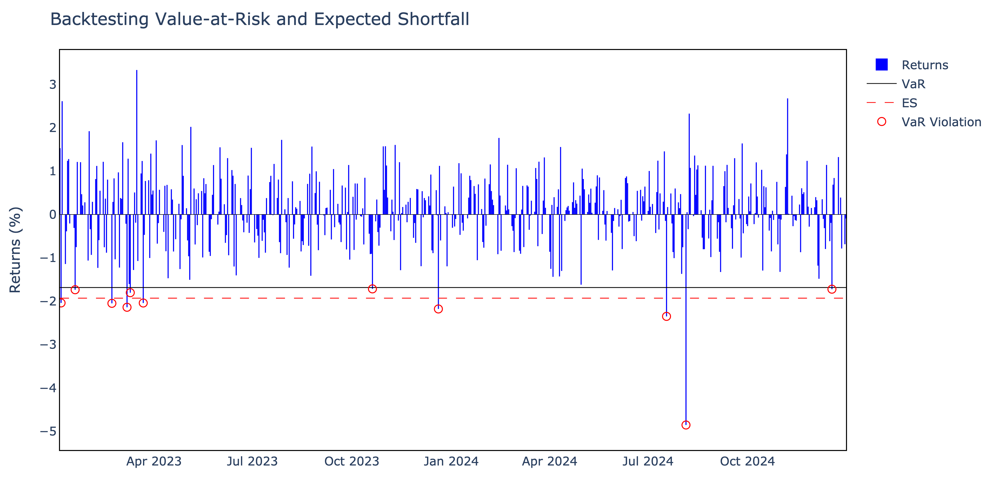

In [54]:
# Plot backtest
pv.plot_backtest(results_one_factor_df, interactive=False)

In [55]:
results_one_factor_df.head()

,Returns,VaR,VaR Violation,VaR_monetary,ES,ES_monetary
Date,,,,,,
2023-01-04,0.015298,0.016838,False,1751.529501,0.019291,2006.665204
2023-01-05,-0.020387,0.016838,True,1751.529501,0.019291,2006.665204
2023-01-06,0.026140,0.016838,False,1751.529501,0.019291,2006.665204
2023-01-09,-0.011418,0.016838,False,1751.529501,0.019291,2006.665204
2023-01-10,-0.003878,0.016838,False,1751.529501,0.019291,2006.665204


### Backtesting Single Factor Models

The normal distribution once again results in more violations. While it is a useful model for large portfolios, this remains a key limitation.

Note: We are technically comparing a CHF-denominated portfolio to a USD benchmark, which introduces currency mismatch and can lead to more violations. This may be reduced by converting one to the other's currency.

In [56]:
# Count violations
sf_violations, sf_violation_rate = pv.count_violations(results_one_factor_df)

# Kupiec Test (Unconditional Coverage)
sf_kupiec = pv.kupiec_test(
    total_violations=sf_violations,
    total_days=len(results_one_factor_df),
    confidence_level=confidence_level
)

# Christoffersen Test (Independence)
sf_christoffersen = pv.christoffersen_test(results_one_factor_df)

# Joint Test (Conditional Coverage)
sf_joint = pv.joint_lr_test(
    LR_uc=sf_kupiec["LR_uc"],
    LR_c=sf_christoffersen["LR_c"]
)

In [57]:
# Summary output
print(f"\n--- Single-Factor VaR Backtesting Summary ---")
print(f"Total Violations     : {sf_violations}")
print(f"Violation Rate       : {sf_violation_rate * 100:.2f}%\n")

print("Kupiec Test (UC):")
print(f"LR_uc               : {sf_kupiec['LR_uc']:.4f}")
print(f"p-value             : {sf_kupiec['p_value']:.4f}")
print(f"Reject Null (5%)    : {sf_kupiec['reject_null']}")

print("\nChristoffersen Test (Independence):")
print(f"LR_c                : {sf_christoffersen['LR_c']:.4f}")
print(f"p-value             : {sf_christoffersen['p_value']:.4f}")
print(f"Reject Null (5%)    : {sf_christoffersen['reject_null']}")

print("\nJoint Test (Conditional Coverage):")
print(f"LR_total            : {sf_joint['LR_total']:.4f}")
print(f"p-value             : {sf_joint['p_value']:.4f}")
print(f"Reject Null (5%)    : {sf_joint['reject_null']}")


--- Single-Factor VaR Backtesting Summary ---
Total Violations     : 11
Violation Rate       : 2.20%

Kupiec Test (UC):
LR_uc               : 5.3947
p-value             : 0.0202
Reject Null (5%)    : True

Christoffersen Test (Independence):
LR_c                : 0.4949
p-value             : 0.4817
Reject Null (5%)    : False

Joint Test (Conditional Coverage):
LR_total            : 5.8897
p-value             : 0.0526
Reject Null (5%)    : False


---

### Simulations

This module estimates 1-day **VaR** and **ES** using simulation-based methods. We support both **parametric Monte Carlo** and **historical simulation**, with an optional **bootstrap** (sampling with replacement). This is also the only module that allows **options** in the portfolio, priced via the **Black-Scholes** formula (European style).

Note: the BS pricing is automatic, we will show an example in which we price the options to see their total value.


In [58]:
# Use existing spot prices and volatilities
S0 = prices_chf.iloc[-1]
volatility_annualized = portfolio_returns.std() * np.sqrt(252)

# Select representative tickers for options
selected_tickers = ["VT", "SPY", "AAPL", "JNJ", "XLI"]

# Create example option contracts
options = [
    {
        "asset_index": tickers.index("AAPL"),
        "K": 200,
        "T": 60 / 252,
        "r": 0.01, # <----- Risk-free rate must be provided each time!
        "sigma": volatility_annualized["AAPL"], # <----- Volatility must be provided also!
        "type": "call",
        "qty": 30 # <----- A negative quantity means short 
    },
    {
        "asset_index": tickers.index("XLI"),
        "K": 115,
        "T": 45 / 252,
        "r": 0.01,
        "sigma": volatility_annualized["XLI"],
        "type": "put",
        "qty": 50
    },
    {
        "asset_index": tickers.index("VT"),
        "K": 100,
        "T": 90 / 252,
        "r": 0.01,
        "sigma": volatility_annualized["VT"],
        "type": "call",
        "qty": 25
    }
]

In [59]:
# Print values of equity positions (already defined)
print("\nEquity Positions (latest prices):")
total_equity_value = 0
for tkr in tickers:
    position_value = shares[tkr] * S0[tkr]
    print(f"{tkr:5}: {shares[tkr]:4} × {S0[tkr]:.2f} = {position_value:,.2f} CHF")
    total_equity_value += position_value

# Price and print values of options
print("\nOption Values (Black-Scholes at time 0):")
total_option_value = 0
for i, opt in enumerate(options):
    spot = S0[tickers[opt["asset_index"]]]
    price_bs = pv.black_scholes(
        spot, opt["K"], opt["T"], opt["r"], opt["sigma"], opt["type"]
    )
    value = price_bs * opt["qty"]
    print(f"Option {i+1} on {tickers[opt['asset_index']]} ({opt['type']}): "
          f"BS = {price_bs:.2f} × {opt['qty']} = {value:,.2f} CHF")
    total_option_value += value

# Print new portfolio value
total_portfolio_value = total_equity_value + total_option_value
print(f"\nTotal equity value:     {total_equity_value:,.2f} CHF")
print(f"Total option value:     {total_option_value:,.2f} CHF")
print(f"Total portfolio value:  {total_portfolio_value:,.2f} CHF")


Equity Positions (latest prices):
VT   :  120 × 105.77 = 12,692.06 CHF
SPY  :   80 × 527.78 = 42,222.66 CHF
VGK  :   60 × 57.10 = 3,425.81 CHF
EWJ  :   40 × 60.61 = 2,424.30 CHF
VWO  :   60 × 39.74 = 2,384.30 CHF
AAPL :   50 × 225.65 = 11,282.25 CHF
JNJ  :   50 × 128.49 = 6,424.39 CHF
PG   :   40 × 149.58 = 5,983.12 CHF
UNH  :   40 × 454.97 = 18,198.74 CHF
NVS  :   30 × 84.74 = 2,542.25 CHF
XLI  :  -30 × 118.65 = -3,559.39 CHF

Option Values (Black-Scholes at time 0):
Option 1 on AAPL (call): BS = 27.80 × 30 = 834.07 CHF
Option 2 on XLI (put): BS = 1.69 × 50 = 84.63 CHF
Option 3 on VT (call): BS = 7.51 × 25 = 187.67 CHF

Total equity value:     104,020.49 CHF
Total option value:     1,106.37 CHF
Total portfolio value:  105,126.85 CHF


#### One-Day Ahead Monte Carlo

The Monte Carlo simulation below estimates 1-day **VaR** and **ES** under the assumption that asset returns follow a **multivariate normal distribution** with parameters $(\mu, \Sigma)$ estimated from historical data. We generate $N$ scenarios using **Cholesky decomposition** to introduce correlation, simulate asset prices, and reprice the portfolio (stocks + options) for each scenario.

Steps:

1. Simulate $N$ one-day return vectors:
   $$
   R_i \sim \mathcal{N}(\mu, \Sigma), \quad i = 1, \dots, N
   $$

2. Convert to asset prices:
   $$
   S_i = S_0 \cdot (1 + R_i)
   $$

3. Compute portfolio profit and loss $\Delta P_i$:
   - stock returns from price changes  
   - option revaluation using:
     $$
     C(S_i, K, T - \Delta t, r, \sigma)
     $$

4. Define losses as $\ell_i = -\Delta P_i$, then compute:
   $$
   \text{VaR}_\alpha = {Q}_\alpha(\ell)
   $$
   $$
   \text{ES}_\alpha = \mathbb{E}\left[\ell \mid \ell \geq \text{VaR}_\alpha\right]
   $$

This method captures the full distribution of portfolio outcomes, including nonlinear effects, but applies to a **single-day horizon** unless extended.

Simulation methods, particularly Monte Carlo, are computationally and mathematically complex in realistic settings. We adopt a _very simplified solution_; for example, interest rate risk and volatility risk are not considered—even in historical simulations.


In [60]:
# Run Parametric Monte Carlo VaR and ES (1-day, 99% level)
var_mc, pnl_mc = pv.monte_carlo_var(
    price_data=prices_chf,  # ensure correct order
    shares=shares,
    options=options,
    confidence_level=confidence_level,
    simulations=50_000, 
    seed=1)

# Calculate ES
es_mc = pv.simulation_es(var_mc, pnl_mc)

# Display Monte Carlo Results
print(f"Monte Carlo VaR ({int(confidence_level * 100)}%):  {var_mc:,.2f} CHF")
print(f"Monte Carlo ES ({int(confidence_level * 100)}%):  {es_mc:,.2f} CHF")

Monte Carlo VaR (99%):  2,480.07 CHF
Monte Carlo ES (99%):  2,834.44 CHF



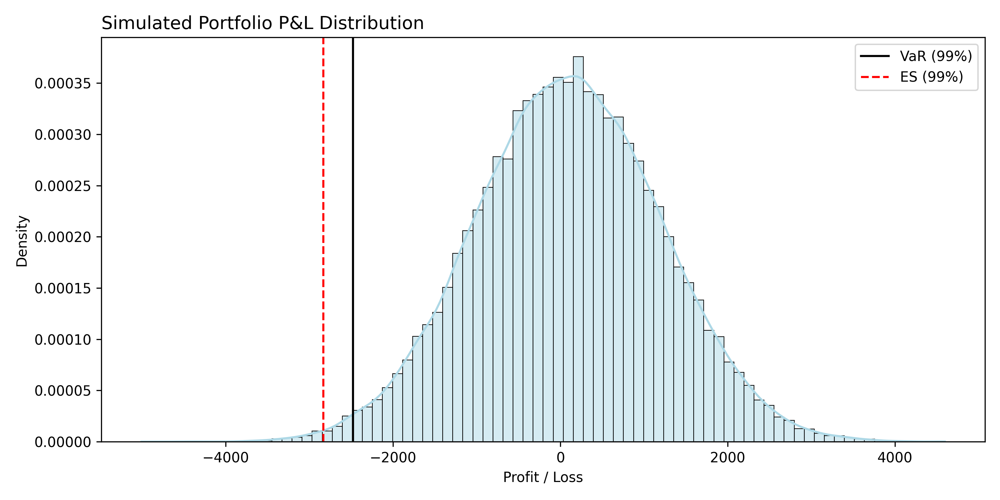

In [61]:
# Plot distribution
pv.plot_simulated_distribution(
    profit_and_loss=pnl_mc,
    var=var_mc,
    es=es_mc,
    confidence_level=confidence_level
)

#### Multiday Monte Carlo

This extension simulates the **evolution of equity prices over multiple days**, capturing compounding and path-dependent risk. At each step, returns are drawn from a multivariate normal distribution using **Cholesky decomposition**. Asset prices evolve recursively, and final portfolio values are computed across all paths. VaR and ES are then estimated from the distribution of final portfolio losses. 

This method applies to **equity-only portfolios**, and assumes constant $(\mu, \Sigma)$ over the entire horizon.

The resulting VaR and ES should be interpreted as **cumulative losses** over the full $n$-day horizon, not as single-day measures.


In [62]:
# Run the simulation
var_mc_20, pnl_mc_20, portfolio_paths = pv.multiday_monte_carlo_var(
    price_data=prices_chf,  
    shares=shares, 
    confidence_level=confidence_level,
    days_ahead=20,
)

# ES
es_mc_20 = pv.simulation_es(var_mc_20, pnl_mc_20)

# Print results
print(f"Monte Carlo 20-day VaR (99%):  {var_mc_20:,.2f} CHF")
print(f"Monte Carlo 20-day ES  (99%):  {es_mc_20:,.2f} CHF")

Monte Carlo 20-day VaR (99%):  7,930.89 CHF
Monte Carlo 20-day ES  (99%):  9,222.72 CHF



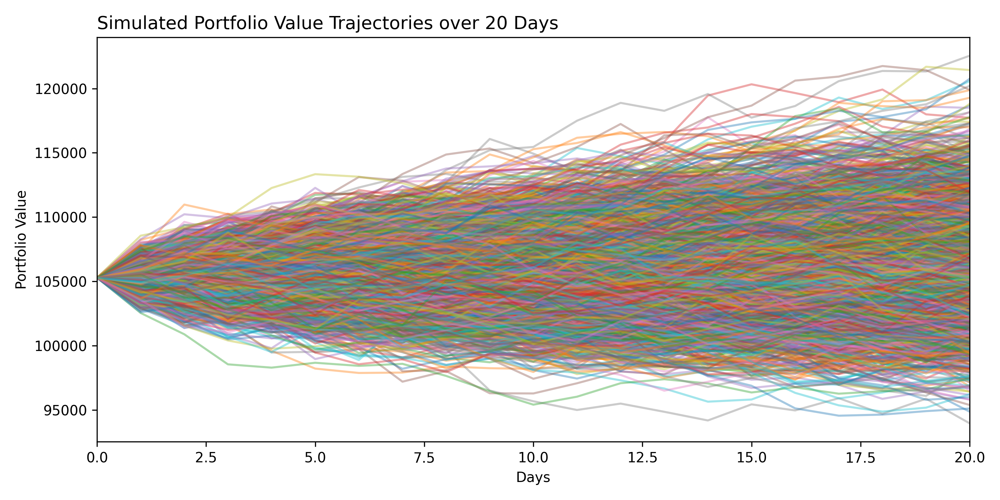

In [63]:
# Plot paths over time
pv.plot_simulated_paths(portfolio_paths)

#### One-Day Ahead Historical Simulation

Historical Simulation (HS) is a fully non-parametric method that estimates 1-day **VaR** and **ES** by replaying past market movements. It bypasses the need to estimate correlations or assume a return distribution, and naturally captures **fat tails** and **co-movements** across assets.

We apply historical return vectors to today’s portfolio to generate alternative price scenarios. The portfolio is repriced (including options), and the resulting losses form an empirical distribution. VaR and ES are computed directly from this distribution without any parametric assumptions.

In [64]:
# Run historical simulation (1-day horizon, 99% confidence)
var_historical, pnl_historical = pv.historical_simulation_var(
    price_data=prices_chf,
    shares=shares.values,
    options=options,
    confidence_level=confidence_level
)

# Calculate ES
es_historical = pv.simulation_es(var_historical, pnl_historical)

# Display results
print(f"Historical Simulation VaR (99%):   {var_historical:,.2f} CHF")
print(f"Historical Simulation ES  (99%):   {es_historical:,.2f} CHF")

Historical Simulation VaR (99%):   2,581.27 CHF
Historical Simulation ES  (99%):   3,355.23 CHF



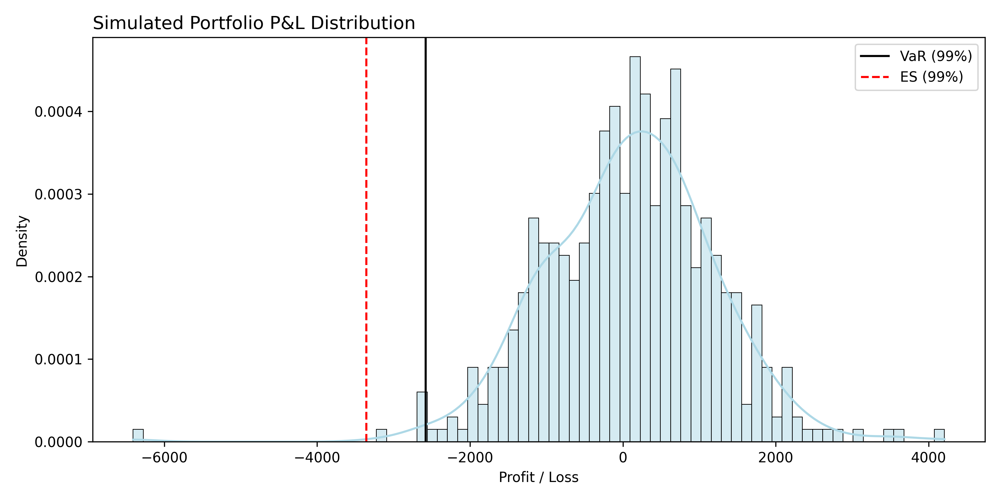

In [65]:
# Plot distribution
pv.plot_simulated_distribution(
    profit_and_loss=pnl_historical,
    var=var_historical,
    es=es_historical,
    confidence_level=0.99
)

#### Comparison of Monte Carlo and Historical Simulation

We compare the simulated 1-day P&L distributions from the **Monte Carlo** and **Historical Simulation** approaches. As expected, the Historical Simulation shows **heavier tails** and **asymmetry**, resulting in a higher ES. This reflects its ability to capture past extreme events without assuming a specific distribution. Feel free to experiment with the bootstrap variant to see the differences!

Note: **no backtesting** is currently implemented for these models, as it is very challenging to perform in practice and computationally intensive.


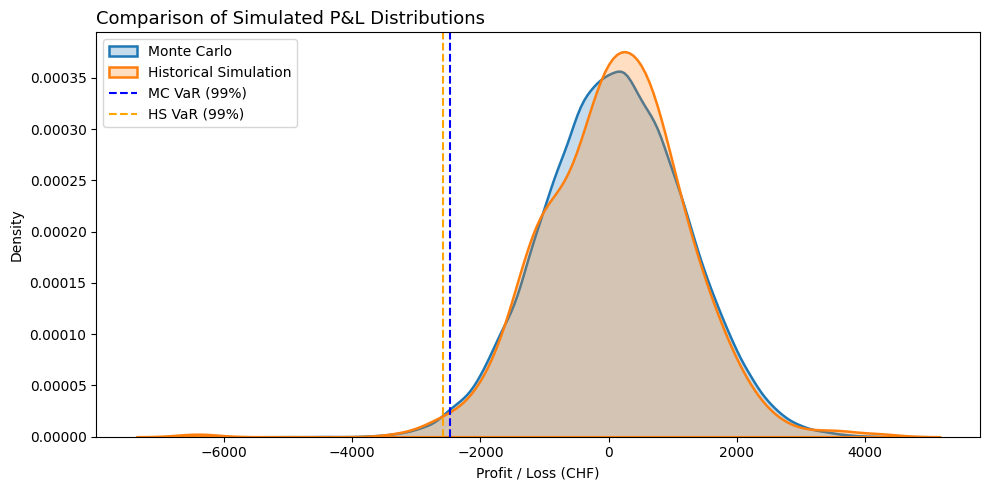

In [66]:
# Larger figure
plt.figure(figsize=(10, 5))

# KDE plots
sns.kdeplot(pnl_mc, label="Monte Carlo", fill=True, color="tab:blue", linewidth=1.8)
sns.kdeplot(pnl_historical, label="Historical Simulation", fill=True, color="tab:orange", linewidth=1.8)

# VaR markers
plt.axvline(-var_mc, color="blue", linestyle="--", linewidth=1.5, label="MC VaR (99%)")
plt.axvline(-var_historical, color="orange", linestyle="--", linewidth=1.5, label="HS VaR (99%)")

# Final formatting
plt.title("Comparison of Simulated P&L Distributions", fontsize=13, loc="left", fontweight="medium")
plt.xlabel("Profit / Loss (CHF)")
plt.ylabel("Density")
plt.legend(loc="upper left")
plt.tight_layout()
plt.show()

## Summary of Results for Portfolio Models

We began with single-asset VaR models using a globally diversified ETF (VT) to represent broad equity exposure. The **parametric normal model** consistently **underestimated risk**, even for this relatively stable asset, due to its reliance on thin tails and constant volatility. 

In contrast, **Historical Simulation** and **Extreme Value Theory (EVT)** produced more realistic risk estimates. However, as they do not account for time-varying volatility, all of these models **failed the Christoffersen and Joint tests**. 

The best-performing model was the **GJR-GARCH** with **skewed-t innovations**, standardized using past residuals — **it passed all backtests**, reflecting its ability to adapt to volatility dynamics and asymmetric return behavior.

Regarding the portfolio experiment, the results across models highlight key trade-offs in risk estimation. The **EWMA correlation model with empirical innovations** performs well, with stable VaR estimates, and strong backtesting (≈1% violations, all tests passed). 

The **single-factor model** underestimates risk and shows a higher violation rate, due to its reliance on normality and lack of time variation.

Simulation-based methods, which include options, yield higher risk figures, with HS also showing a much higher ES due to fat tails. This is expected, as Historical Simulation better captures extreme past events, while Monte Carlo assumes Gaussian returns.

Overall, the models behave as expected: **simpler models underreact**, while **empirical or simulation-based methods** capture more realistic risk dynamics.
